In [1]:
import torch
import numpy as np
import os
import random
from PIL import Image
import albumentations as A
import matplotlib.pyplot as plt
from albumentations.pytorch import ToTensorV2
from utils import (
    save_checkpoint, 
    load_checkpoint, 
    get_loaders,
    plot_image_mask_box_pred_box,
    plot_image_mask_box_pred_box_tolerance
    )

import matplotlib.patches as patches

from models import  UNET
from monai.networks.nets import UNet

INFO:albumentations.check_version:A new version of Albumentations is available: 1.4.20 (you have 1.4.12). Upgrade using: pip install -U albumentations. To disable automatic update checks, set the environment variable NO_ALBUMENTATIONS_UPDATE to 1.
/usr/lib/python3/dist-packages/requests/__init__.py:87: RequestsDependencyWarning: urllib3 (2.2.2) or chardet (4.0.0) doesn't match a supported version!
  warnings.warn("urllib3 ({}) or chardet ({}) doesn't match a supported "


In [3]:
# HYPERPARAMETERS:
DEVICE = "cuda" if torch.cuda.is_available() else "cpu"
LOGGING = False
NUM_EPOCHS = 100
random.seed(42)
torch.manual_seed(42)

# Segmentation 

In [5]:


Own_unet = UNET(in_channels=1, out_channels=1, features= [16, 32, 64, 128]).to(DEVICE)
Monai_UNet = UNet(
        spatial_dims=2,
        in_channels=1,
        out_channels=1,
        channels=(16, 32, 64, 128),
        strides=(2, 2, 2),
        bias = False,
        num_res_units = 0,
    ).to(device=DEVICE)


load_checkpoint(Own_unet, r'/home/alex/Documents/new try/Data/Lung Unet/save_states/Own_unet_padding_1.pth.tar') #r'/home/alex/Documents/new try/Data/Lung Unet/save_states/simulate_data/Own_unet_1.pth.tar') 
load_checkpoint(Monai_UNet, r'/home/alex/Documents/new try/Data/Lung Unet/save_states/simulate_data/Monai_Unet_1.pth.tar')

=> Loading checkpoint
=> Loading checkpoint


In [7]:
from simulated_lung_dataset_gaussian import get_loaders_simulated
train_loader, test_loader, validation_loader = get_loaders_simulated() #get_loaders_simulated

#train_loader, test_loader, validation_loader = get_loaders()

/tmp/ipykernel_109086/3499821665.py:41: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  plt.legend()


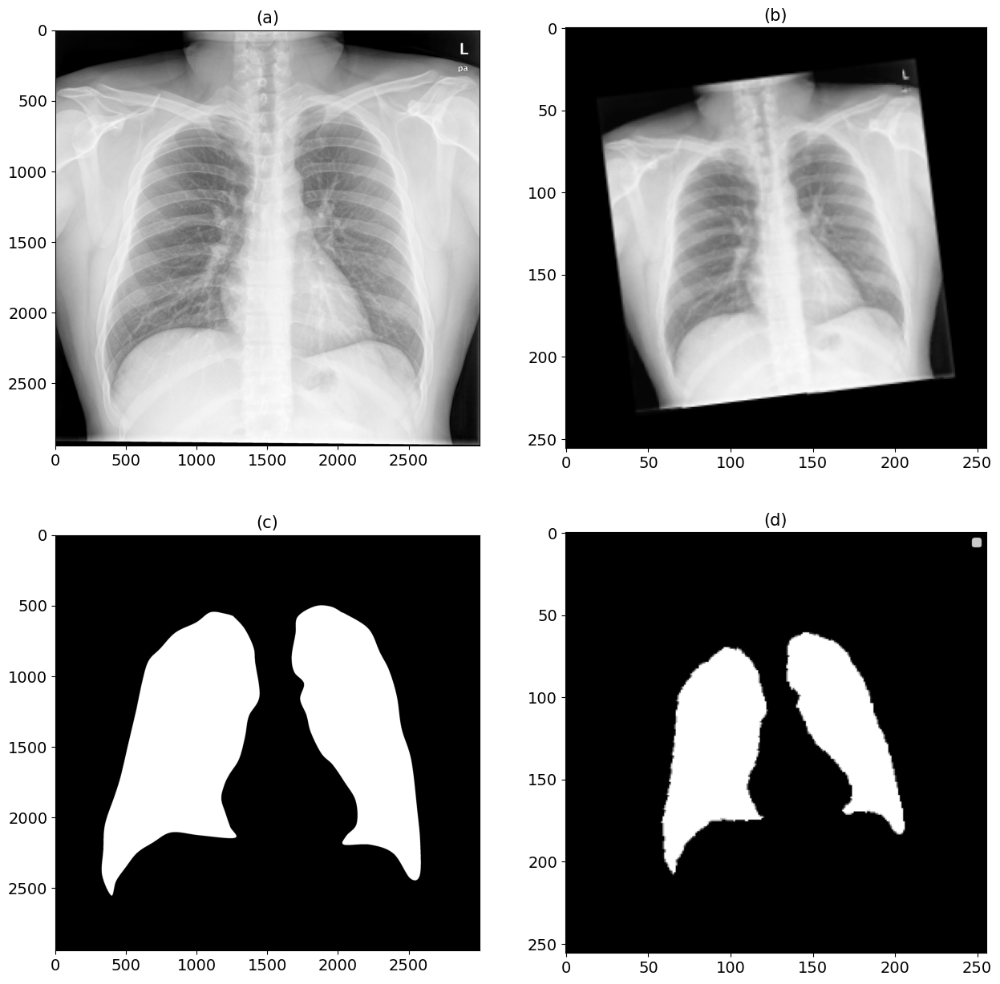

In [8]:
#train_loader, test_loader, validation_loader = get_loaders()

#test_image, test_mask = next(iter(test_loader))
test_image = np.array(Image.open(r'/home/alex/Documents/new try/Data/Lung Unet/data/test/images/CHNCXR_0019_0.png').convert('L'))
test_mask = np.array(Image.open(r'/home/alex/Documents/new try/Data/Lung Unet/data/test/masks/CHNCXR_0019_0_mask.png').convert('L'))


fig, axs = plt.subplots(2, 2, figsize=(15, 15))

axs[0,0].imshow(test_image, cmap='gray')
axs[0,0].set_title('(a)', fontsize=15)
axs[0,0].tick_params(axis='both', labelsize=14)

axs[1,0].imshow(test_mask, cmap='gray')
axs[1,0].set_title('(c)', fontsize=15)
axs[1,0].tick_params(axis='both', labelsize=14)

transform_padding = A.Compose(
    [
        A.Resize(height=256, width=256),
        A.CropAndPad(px = 40, keep_size=True),
        A.Rotate(limit= 15, p = 1),
        ToTensorV2(),
    ],
)
transform_output = transform_padding(image=test_image, mask=test_mask)
test_image_trans = transform_output["image"]
test_mask_trans = transform_output["mask"]


axs[0,1].imshow(test_image_trans[0], cmap='gray')
axs[0,1].set_title('(b)', fontsize=15)
axs[0,1].tick_params(axis='both', labelsize=14)

axs[1,1].imshow(test_mask_trans, cmap='gray')
axs[1,1].set_title('(d)', fontsize=15)
axs[1,1].tick_params(axis='both', labelsize=14)

#plt.savefig(r'/home/alex/Documents/Images_thesis/segmentation_augementation.png', bbox_inches="tight")

plt.legend()
plt.show()

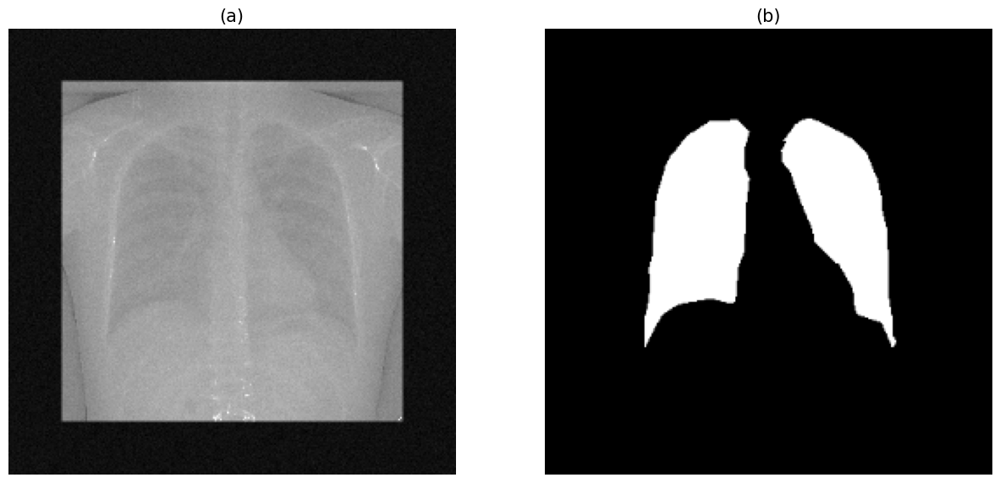

In [9]:
test_image, test_mask = next(iter(test_loader))

fig, axs = plt.subplots(1, 2, figsize=(15, 15))

axs[0].imshow(test_image[0,0], cmap='gray')
axs[0].set_title('(a)', fontsize=15)
axs[0].tick_params(axis='both', labelsize=14)
axs[0].axis('off')
axs[1].imshow(test_mask[0,0], cmap='gray')
axs[1].set_title('(b)', fontsize=15)
axs[1].tick_params(axis='both', labelsize=14)
axs[1].axis('off')

#fig.savefig(r'/home/alex/Documents/Images_thesis/for_simulated_0.2.png', bbox_inches="tight")
plt.show()

image that shows difference between bounding box with and without added tolerance

In [10]:
from utils import get_loaders
train_loader, test_loader, validation_loader = get_loaders()

In [11]:
Own_unet = UNET(in_channels=1, out_channels=1, features= [16, 32, 64, 128]).to(DEVICE)
Monai_UNet = UNet(spatial_dims=2,in_channels=1,out_channels=1,channels=(16, 32, 64, 128),strides=(2, 2, 2),bias = False,num_res_units = 0,).to(device=DEVICE)


load_checkpoint(Own_unet, r'/home/alex/Documents/new try/Data/Lung Unet/save_states/Own_unet_padding_1.pth.tar') #r'/home/alex/Documents/new try/Data/Lung Unet/save_states/simulate_data/Own_unet_1.pth.tar') 
load_checkpoint(Monai_UNet, r'/home/alex/Documents/new try/Data/Lung Unet/save_states/simulate_data/Monai_Unet_gaussian0.pth.tar')

=> Loading checkpoint
=> Loading checkpoint


tensor([ 57.,  54., 199., 180.])


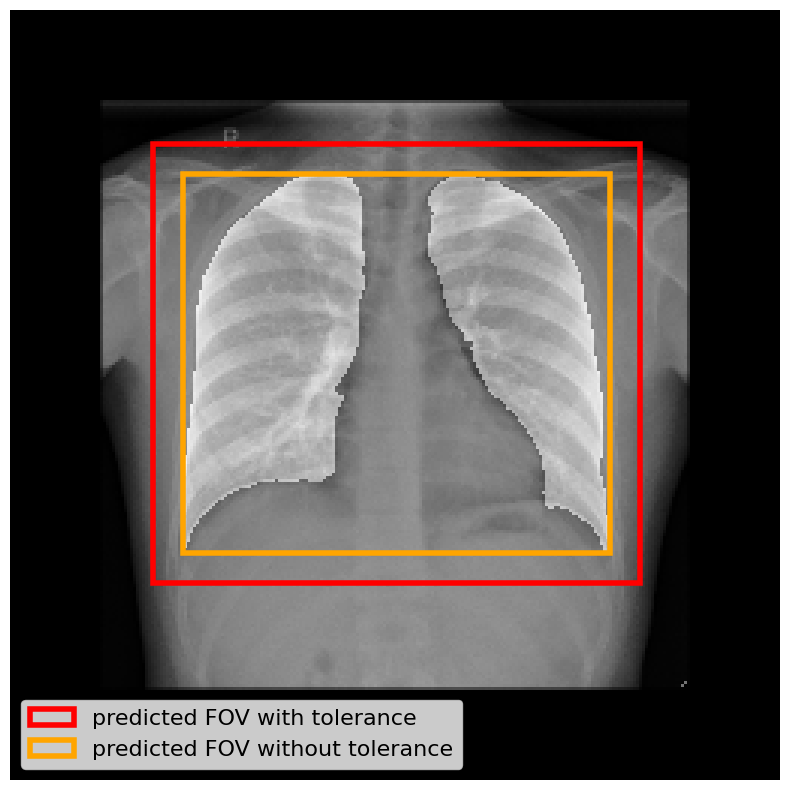

In [12]:
from utils import get_largest_segments_bounding_box, check_metrics
from copy import copy
test_image, test_mask = next(iter(test_loader))
x = test_image.to(DEVICE)
y = test_mask.to(DEVICE)
preds = Own_unet(x)
preds = torch.sigmoid(preds)
preds = (preds > 0.5).float()
preds = preds.cpu().detach().numpy()

boxes_pred = get_largest_segments_bounding_box(preds)[0]
print(boxes_pred)

fig, axs = plt.subplots(1, 1, figsize=(30, 10))
rect_pred = patches.Rectangle((boxes_pred[0], boxes_pred[1]), boxes_pred[2] - boxes_pred[0],
                                boxes_pred[3] - boxes_pred[1], linewidth=4, edgecolor='orange', facecolor='none', label='predicted FOV without tolerance')

rect_pred_tolerance = patches.Rectangle((boxes_pred[0] - 10, boxes_pred[1]-10), boxes_pred[2] - boxes_pred[0] + 20,
                                boxes_pred[3] - boxes_pred[1] + 20, linewidth=4, edgecolor='red', facecolor='none', label='predicted FOV with tolerance')


axs.imshow(test_image[0, 0], cmap='gray')

axs.imshow(preds[0, 0], cmap='gray', alpha=0.4) 


pred_rect_copy = copy(rect_pred)
mask_rect_copy = copy(rect_pred_tolerance)
axs.add_patch(mask_rect_copy)
axs.add_patch(pred_rect_copy)
axs.axis('off')

plt.legend(fontsize = 16, loc='lower left')
#plt.savefig(r'/home/alex/Documents/Images_thesis/predicted_FOV_with_without_tolerance.png', bbox_inches="tight")
plt.show()

Example simulation of ultra-low-dose image std 10 and noise ratio 0.5

In [13]:
from simulated_lung_dataset_gaussian_std import get_loaders_simulated
train_loader_sim, test_loader_sim, validation_loader_sim = get_loaders_simulated(image_std=10, noise_std_ratio=1)
test_image_sim, test_mask_sim = next(iter(test_loader_sim))

train_loader_sim, test_loader_sim_2, validation_loader_sim = get_loaders_simulated(image_std=10, noise_std_ratio=0.5)
test_image_sim_2, test_mask_sim = next(iter(test_loader_sim_2))

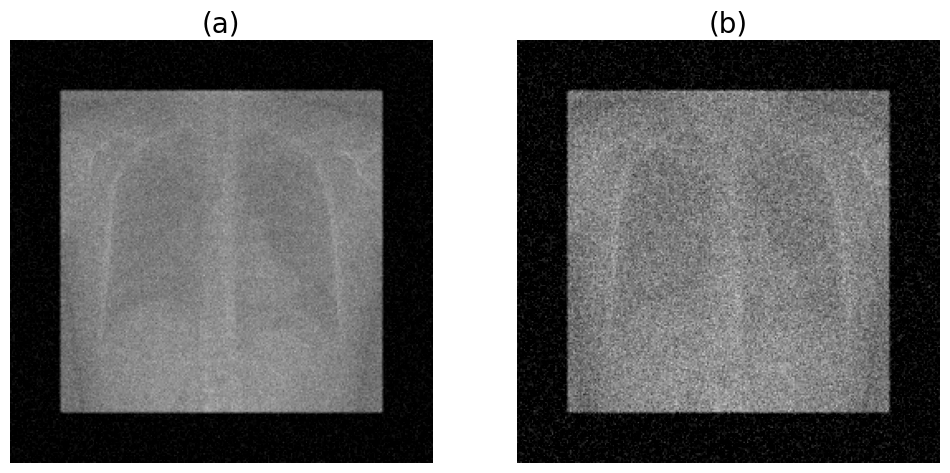

In [16]:
fig, axs = plt.subplots(1, 2, figsize=(12, 6))



axs[0].imshow(test_image_sim[0, 0], cmap='gray',vmin=0, vmax=1)
axs[0].set_title('(a)', fontsize=20)
axs[0].axis('off')


axs[1].imshow(test_image_sim_2[0, 0], cmap='gray', vmin= 0,vmax=1)
axs[1].set_title('(b)', fontsize=20)
axs[1].axis('off')

#plt.legend(fontsize = 16, loc='lower left')

#plt.savefig(r'/home/alex/Documents/Images_thesis/example_lower_doses.png', bbox_inches="tight")
plt.show()

replicate segmentation mask problem image 

In [4]:
from simulated_lung_dataset_poisson import get_loaders_simulated
train_loader, test_loader, validation_loader = get_loaders_simulated()

In [5]:
Own_unet = UNET(in_channels=1, out_channels=1, features= [16, 32, 64, 128]).to(DEVICE)
Monai_UNet = UNet(spatial_dims=2,in_channels=1,out_channels=1,channels=(16, 32, 64, 128),strides=(2, 2, 2),bias = False,num_res_units = 0,).to(device=DEVICE)


load_checkpoint(Own_unet, r'/home/alex/Documents/new try/Data/Lung Unet/save_states/Own_unet_padding_2.pth.tar') #r'/home/alex/Documents/new try/Data/Lung Unet/save_states/simulate_data/Own_unet_1.pth.tar') 
load_checkpoint(Monai_UNet, r'/home/alex/Documents/new try/Data/Lung Unet/save_states/simulate_data/Monai_Unet_gaussian0.pth.tar')

=> Loading checkpoint
=> Loading checkpoint


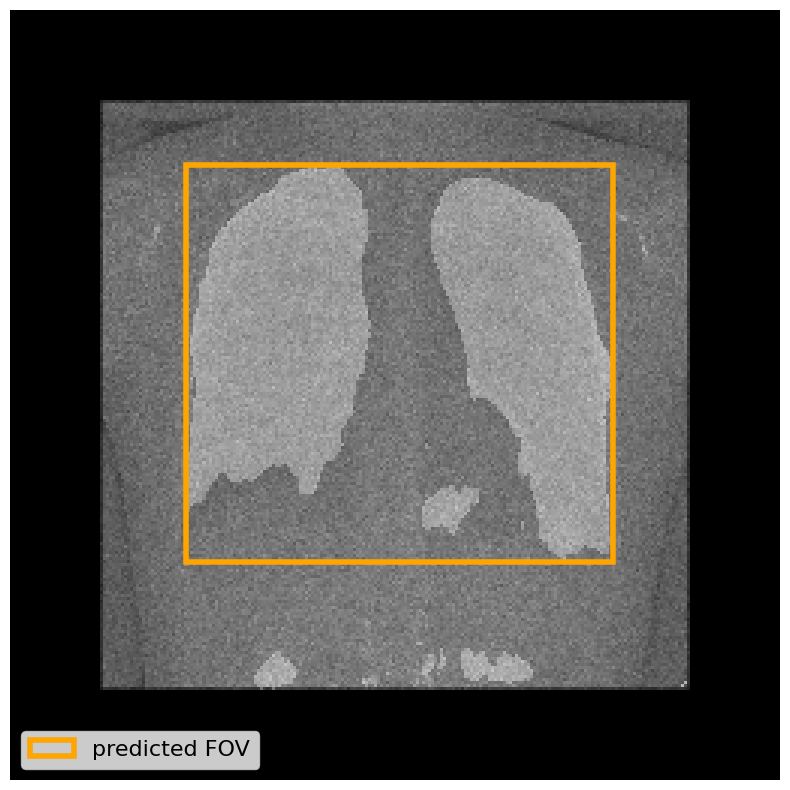

In [11]:
from utils import get_largest_segments_bounding_box, check_metrics
from copy import copy
test_image, test_mask = next(iter(test_loader))

x = test_image.to(DEVICE)
y = test_mask.to(DEVICE)
preds = Own_unet(x)
preds = torch.sigmoid(preds)
preds = (preds > 0.5).float()
preds = preds.cpu().detach().numpy()
boxes_mask = get_largest_segments_bounding_box(test_mask)[0]
boxes_pred = get_largest_segments_bounding_box(preds)[0]

fig, axs = plt.subplots(1, 1, figsize=(30, 10))
rect_pred = patches.Rectangle((boxes_pred[0], boxes_pred[1]), boxes_pred[2] - boxes_pred[0],
                                boxes_pred[3] - boxes_pred[1], linewidth=4, edgecolor='orange', facecolor='none', label='predicted FOV')
rect_mask = patches.Rectangle((boxes_mask[0], boxes_mask[1]), boxes_mask[2] - boxes_mask[0],
                                boxes_mask[3] - boxes_mask[1], linewidth=4, edgecolor='dodgerblue', facecolor='none', label='')


axs.imshow(test_image[0, 0], cmap='gray', vmin=0, vmax=1) #, vmin=0, vmax=1)
axs.imshow(preds[0, 0], cmap='gray', alpha=0.2) 

pred_rect_copy = copy(rect_pred)
mask_rect_copy = copy(rect_mask)
#axs.add_patch(mask_rect_copy)
axs.add_patch(pred_rect_copy)
axs.axis('off')
axs.legend(fontsize = 16, loc='lower left')

plt.savefig(r'/home/alex/Documents/Images_thesis/example_bounding_box_problem.svg', bbox_inches="tight", format="svg")
plt.show()

Overreach and underreach examples

In [10]:
DEVICE = 'cuda'
Own_unet = UNET(in_channels=1, out_channels=1, features= [16, 32, 64, 128]).to(DEVICE)
Monai_UNet = UNet(
        spatial_dims=2,
        in_channels=1,
        out_channels=1,
        channels=(16, 32, 64, 128),
        strides=(2, 2, 2),
        bias = False,
        num_res_units = 0,
    ).to(device=DEVICE)

In [11]:
load_checkpoint(Own_unet, r'/home/alex/Documents/new try/Data/Lung Unet/save_states/Own_Unet_gaussian_10.pth.tar') #r'/home/alex/Documents/new try/Data/Lung Unet/save_states/simulate_data/Own_unet_1.pth.tar') 
load_checkpoint(Monai_UNet, r'/home/alex/Documents/new try/Data/Lung Unet/save_states/Monai_Unet_gaussian1_0.pth.tar')

=> Loading checkpoint
=> Loading checkpoint


In [12]:
from simulated_lung_dataset_gaussian import get_loaders_simulated
from utils import get_loaders
train_loader, test_loader, validation_loader = get_loaders_simulated(batch_size=1)
_, test_loader_n, _ = get_loaders(batch_size=1)

In [13]:
def plot_image_mask_box_pred_box(model, test_image, test_mask, device="cuda"):
    x = test_image.to(device)
    y = test_mask.to(device)
    preds = model(x)
    preds = torch.sigmoid(preds)
    preds = (preds > 0.5).float()
    boxes_mask = get_largest_segments_bounding_box(test_mask)[0]
    boxes_pred = get_largest_segments_bounding_box(preds.cpu())[0]

    rect_pred = patches.Rectangle((boxes_pred[0], boxes_pred[1]), boxes_pred[2] - boxes_pred[0],
                                  boxes_pred[3] - boxes_pred[1], linewidth=4, edgecolor='orange', facecolor='none', label='predicted FOV')
    rect_mask = patches.Rectangle((boxes_mask[0], boxes_mask[1]), boxes_mask[2] - boxes_mask[0],
                                  boxes_mask[3] - boxes_mask[1], linewidth=4, edgecolor='dodgerblue', facecolor='none', label='optimal FOV')

    fig = plt.figure(figsize=(10, 10))  # Set the figure size
    gs = fig.add_gridspec(2, 2, height_ratios=[1.5, 2])  # Make the top row smaller

    # Top image (smaller)
    ax1 = fig.add_subplot(gs[0, :])  # First row, spanning both columns
    ax1.imshow(test_image[0, 0], cmap='gray', vmin = 0, vmax =1)
    ax1.set_title("(a)", size = 16)
    ax1.axis('off')

    # Bottom left image (larger)
    ax2 = fig.add_subplot(gs[1, 0])  # Second row, first column
    ax2.imshow(test_mask[0, 0], cmap='gray')
    ax2.set_title("(b)", size = 16)
    ax2.axis('off')

    # Bottom right image (larger)
    ax3 = fig.add_subplot(gs[1, 1]) 
    ax3.imshow(preds[0, 0].cpu(), cmap='gray')
    ax3.set_title("(c)", size = 16)
    ax3.axis('off')

    for ax in [ax1, ax2, ax3]:
        pred_rect_copy = copy(rect_pred)
        mask_rect_copy = copy(rect_mask)
        ax.add_patch(mask_rect_copy)
        ax.add_patch(pred_rect_copy)
    
    ax1.legend(loc='lower left', fontsize = 16)
    #plt.close(fig)
    plt.tight_layout()
    plt.show()
    return fig

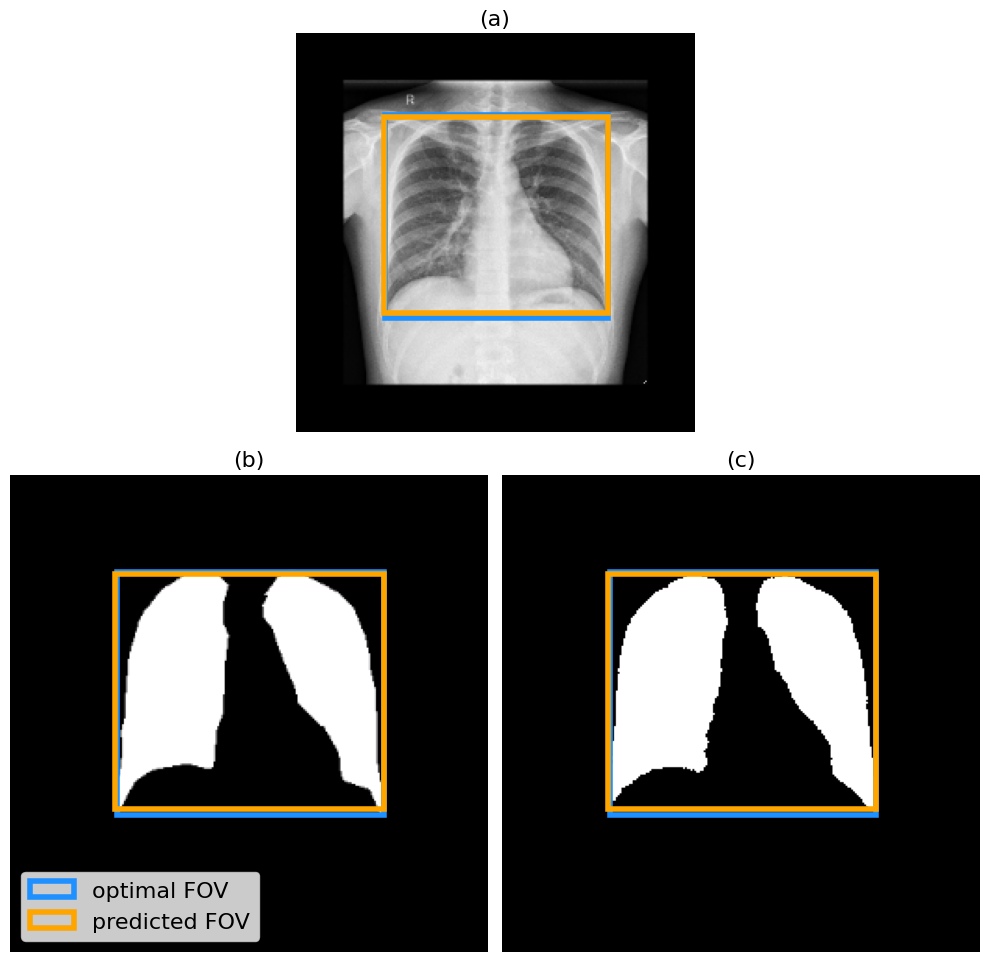

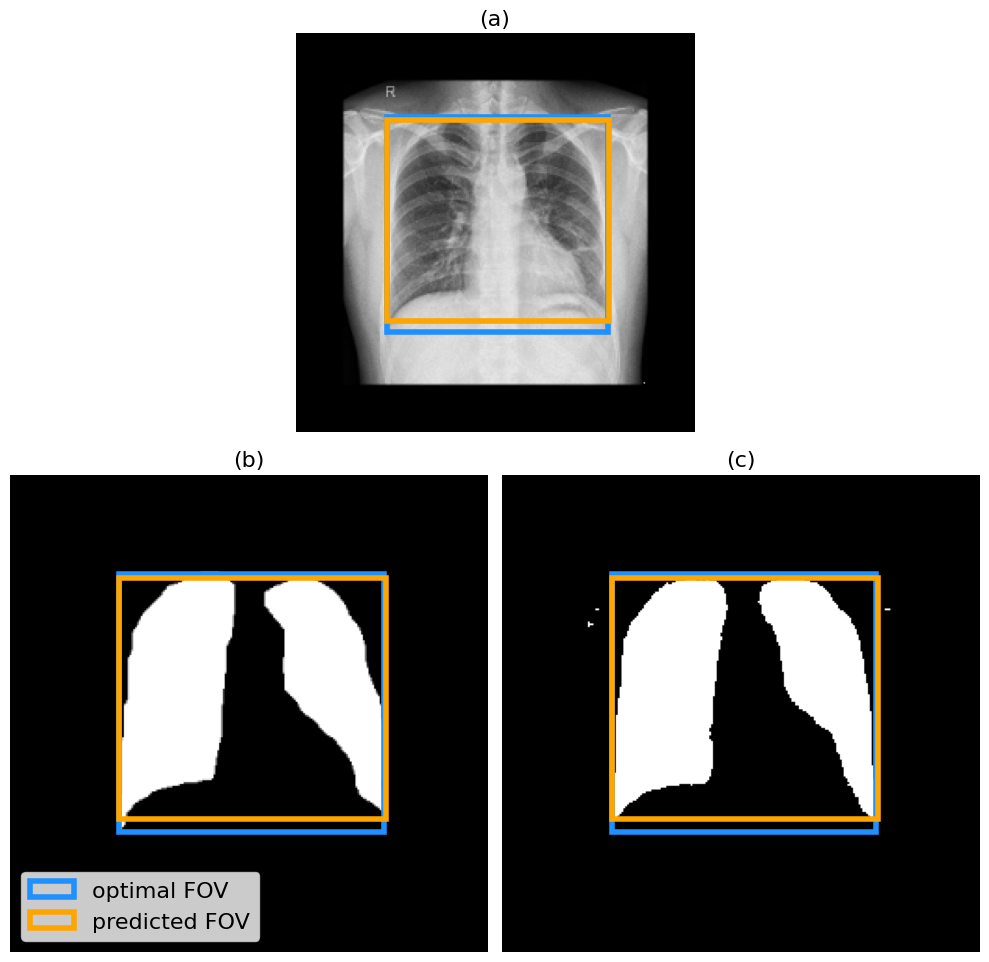

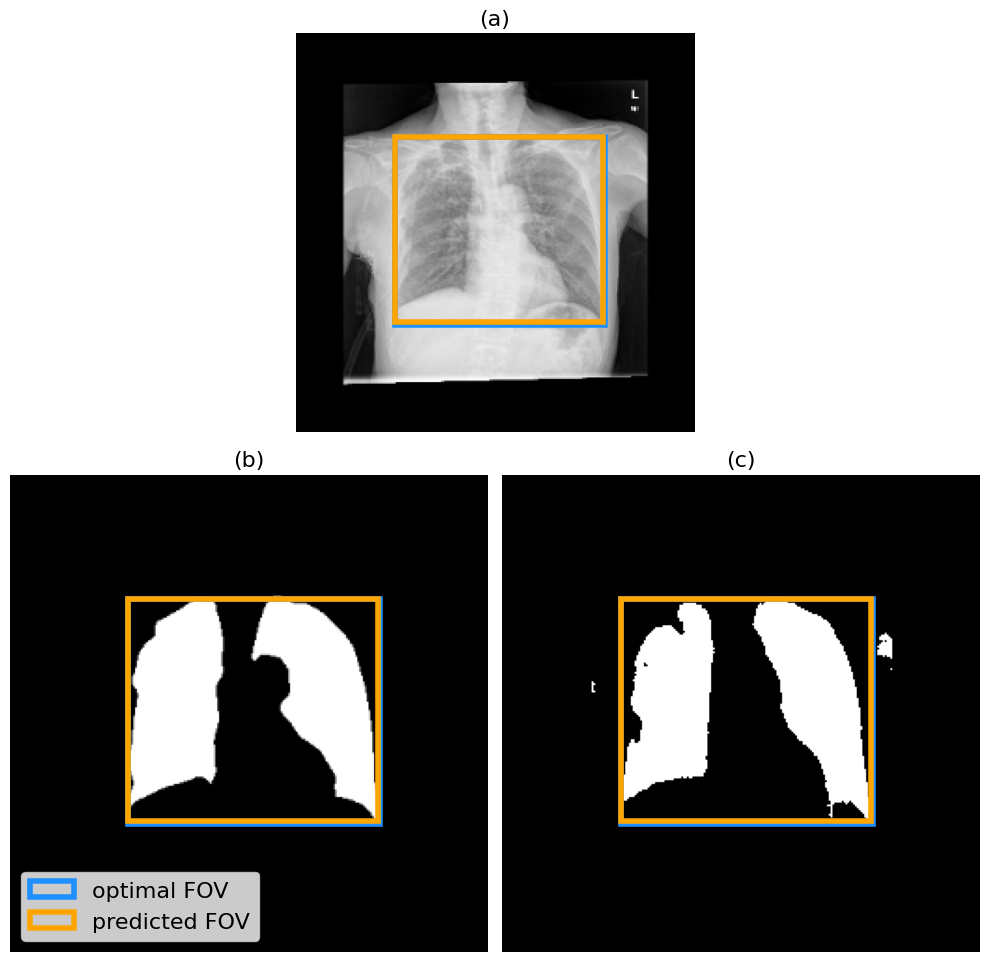

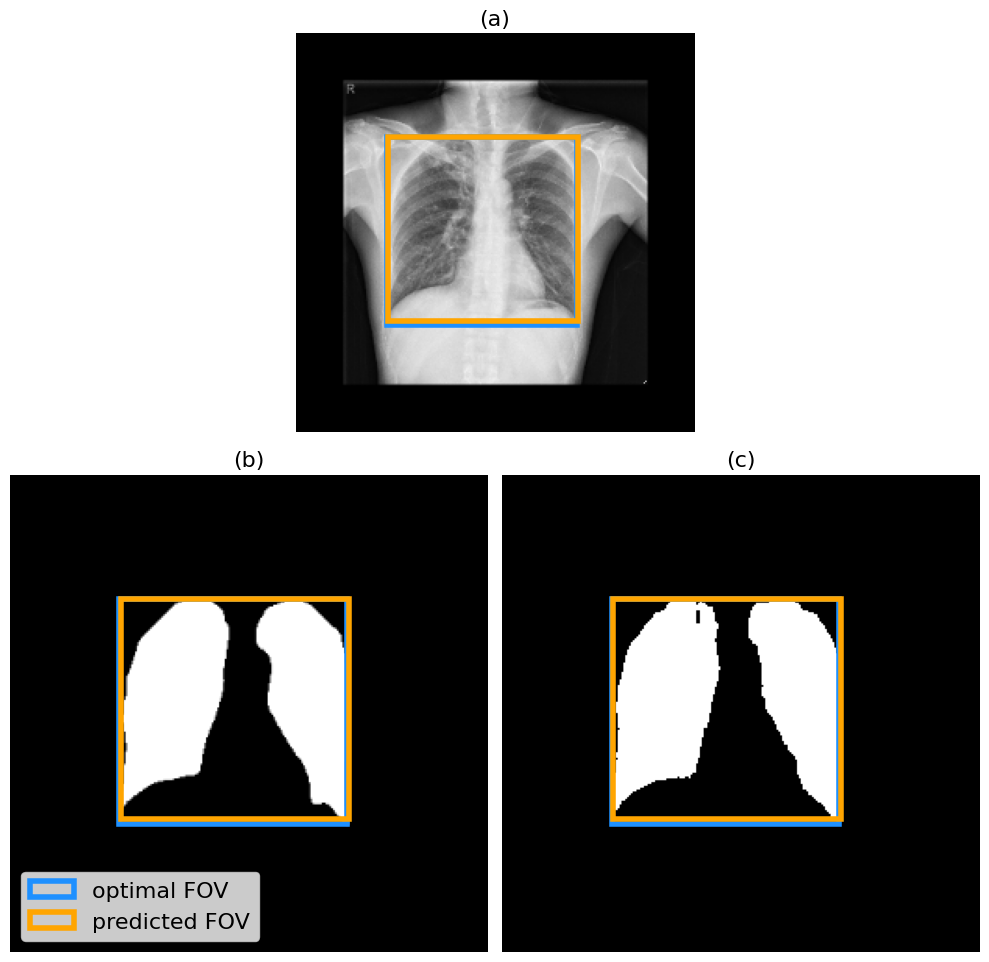

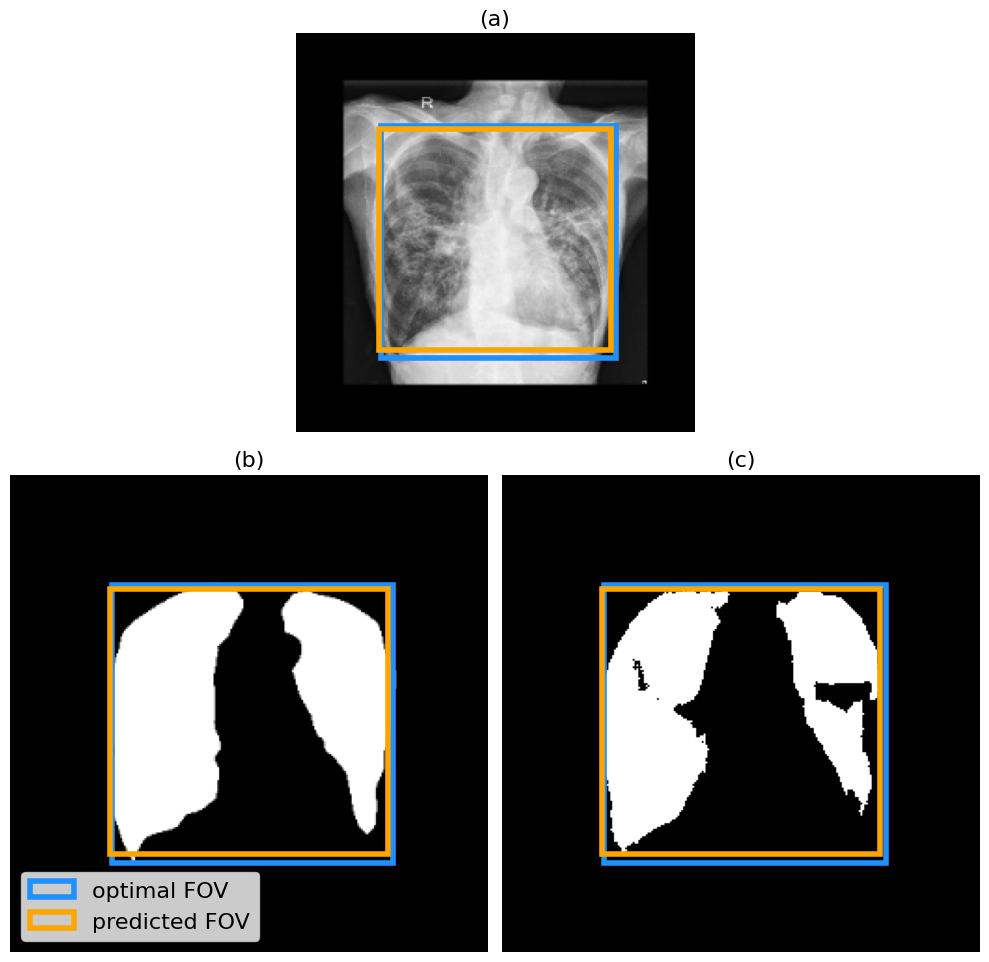

...

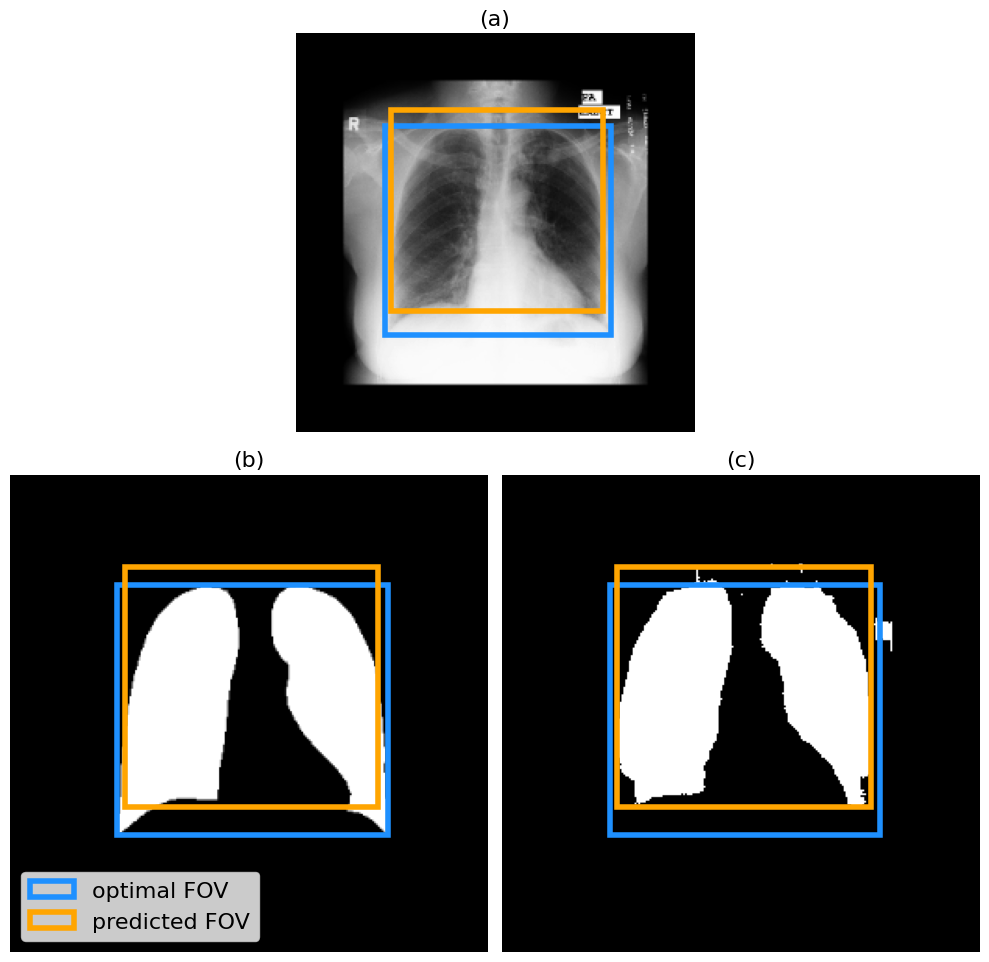

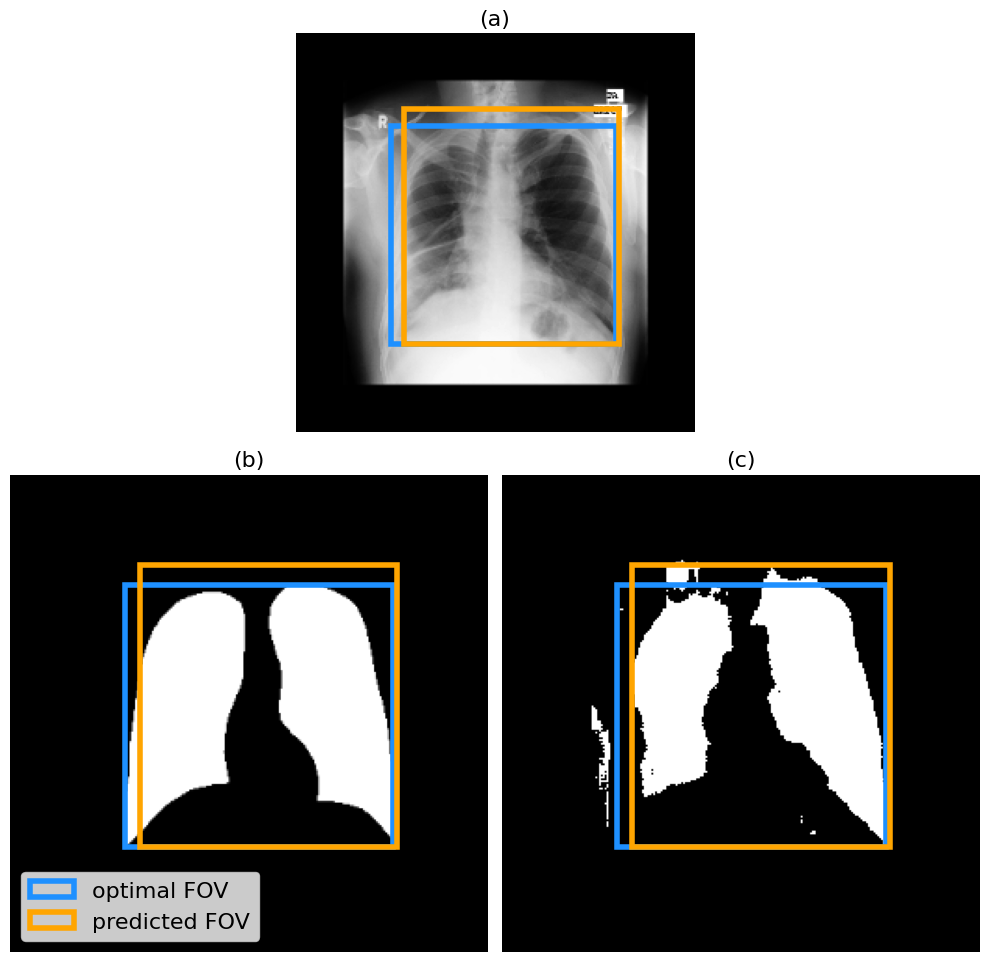

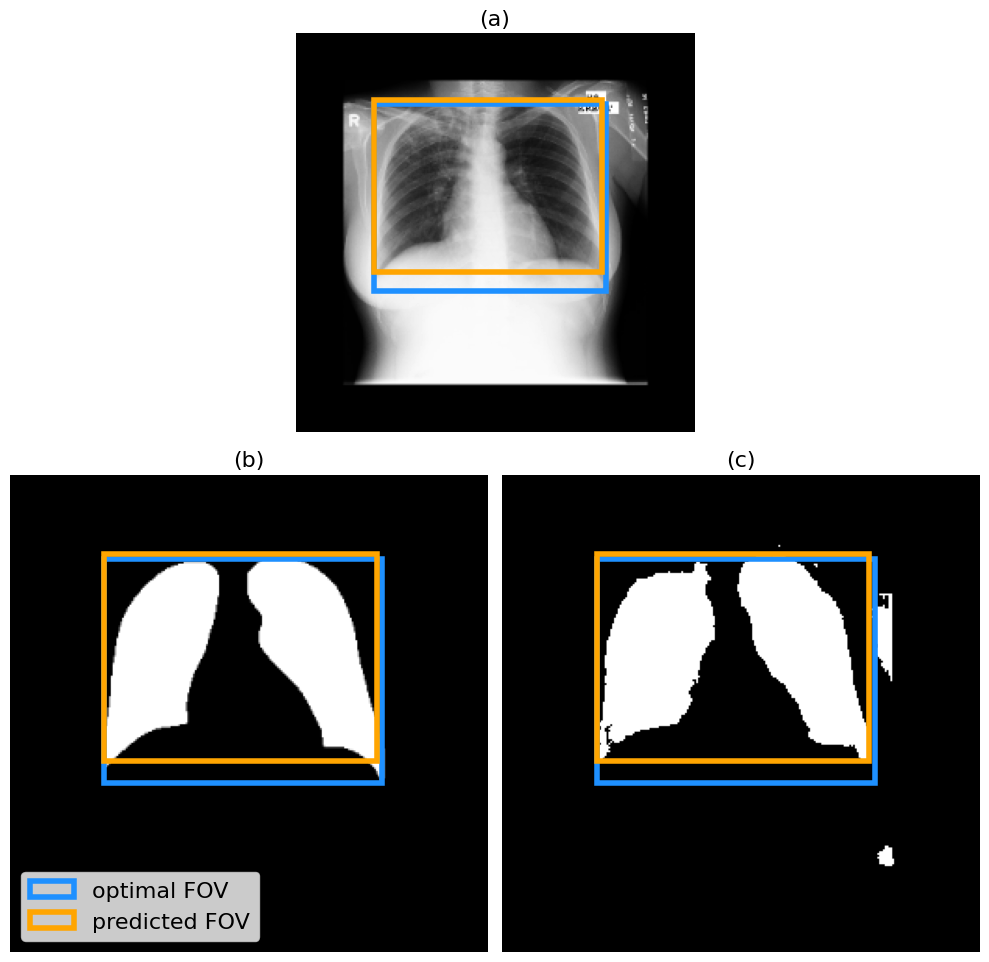

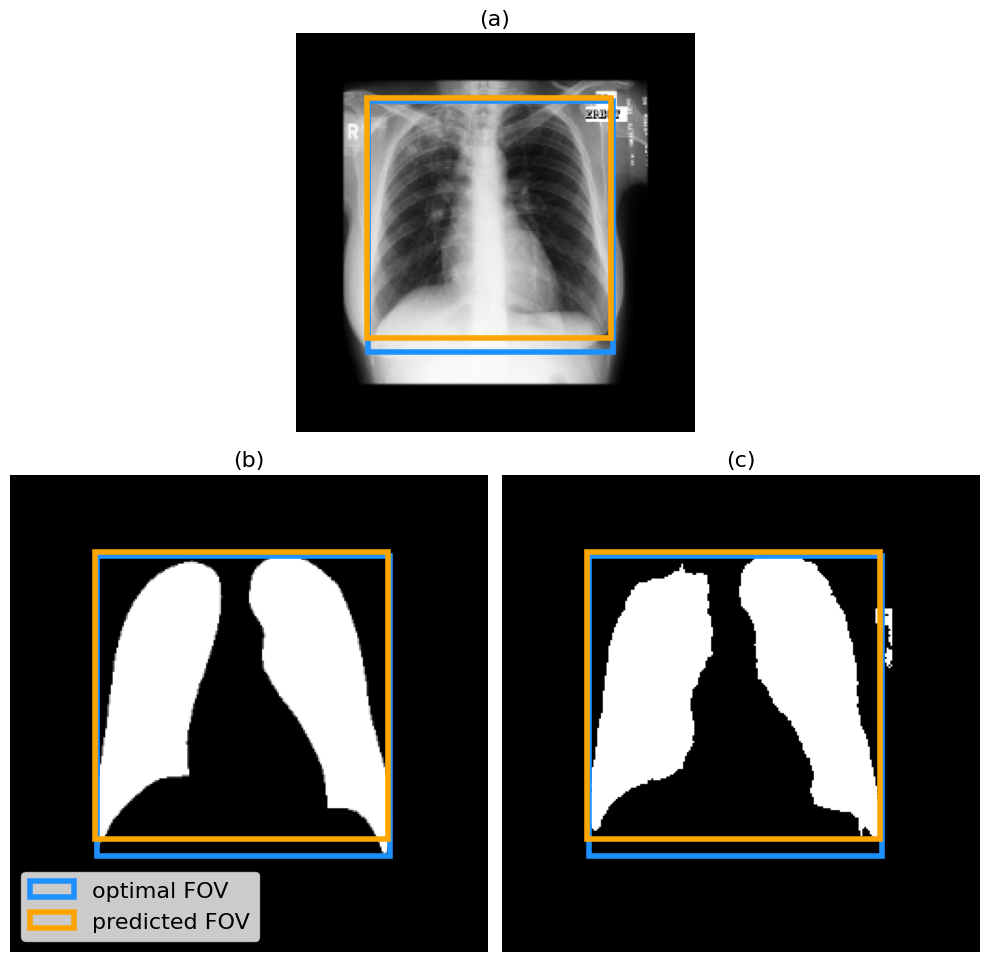

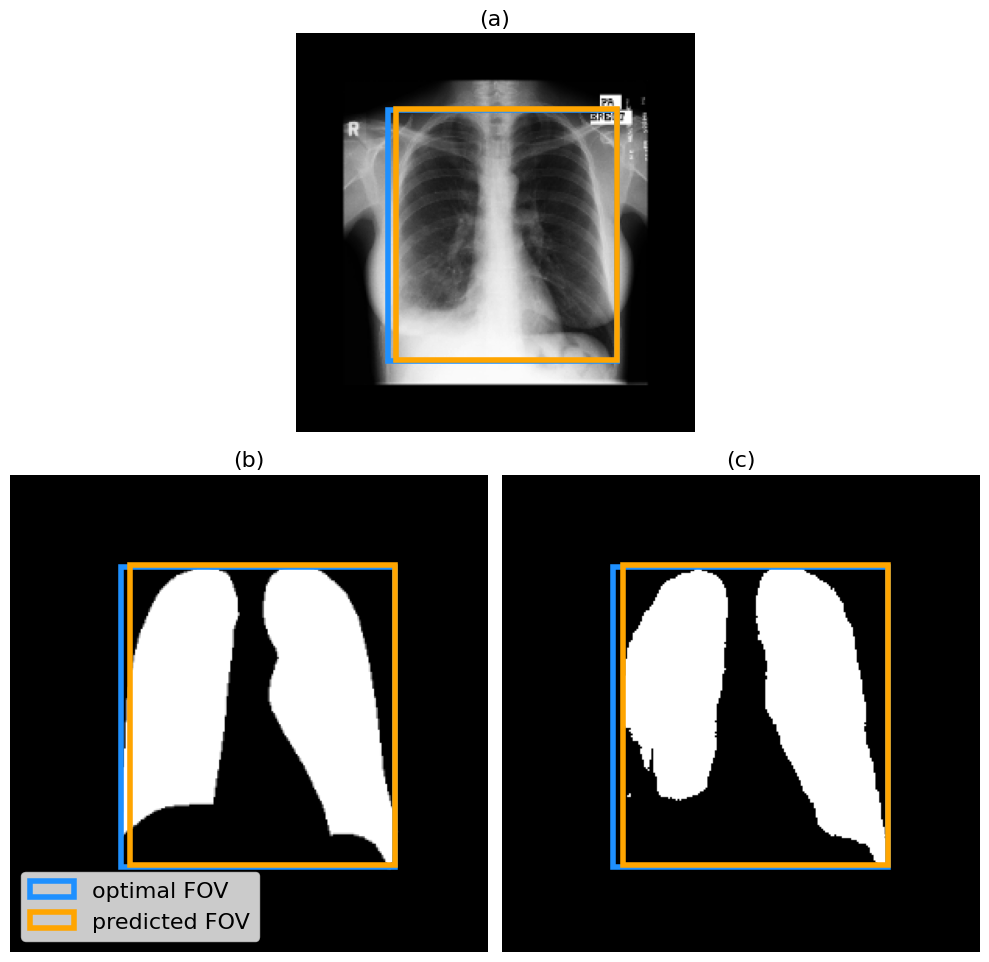

In [22]:
i = 0
device = 'cuda'
from boundingbox import get_largest_segments_bounding_box, metric_largest_box_iou
from copy import copy

test_loader_iter = iter(test_loader)
test_loader_iter_n = iter(test_loader_n)
for i in range(len(test_loader)):
    image, mask = next(test_loader_iter)
    image_n, _  = next(test_loader_iter_n)
    if True:
        x = image.to(device)
        y = mask.to(device)
        preds = Monai_UNet(x)
        preds = torch.sigmoid(preds)
        preds = (preds > 0.5).float()
        boxes_mask = get_largest_segments_bounding_box(mask)[0]
        boxes_pred = get_largest_segments_bounding_box(preds.cpu())[0]

        rect_pred = patches.Rectangle((boxes_pred[0], boxes_pred[1]), boxes_pred[2] - boxes_pred[0],
                                    boxes_pred[3] - boxes_pred[1], linewidth=4, edgecolor='orange', facecolor='none', label='predicted FOV')
        rect_mask = patches.Rectangle((boxes_mask[0], boxes_mask[1]), boxes_mask[2] - boxes_mask[0],
                                    boxes_mask[3] - boxes_mask[1], linewidth=4, edgecolor='dodgerblue', facecolor='none', label='optimal FOV')

        fig = plt.figure(figsize=(10, 10))  # Set the figure size
        gs = fig.add_gridspec(2, 2, height_ratios=[1.5, 2])  # Make the top row smaller

        # Top image (smaller)
        ax1 = fig.add_subplot(gs[0, :])  # First row, spanning both columns
        ax1.imshow(image_n[0, 0], cmap='gray', vmin = 0, vmax =1)
        ax1.set_title("(a)", size = 16)
        ax1.axis('off')

        # Bottom left image (larger)
        ax2 = fig.add_subplot(gs[1, 0])  # Second row, first column
        ax2.imshow(mask[0, 0], cmap='gray')
        ax2.set_title("(b)", size = 16)
        ax2.axis('off')

        # Bottom right image (larger)
        ax3 = fig.add_subplot(gs[1, 1]) 
        ax3.imshow(preds[0, 0].cpu(), cmap='gray')
        ax3.set_title("(c)", size = 16)
        ax3.axis('off')

        for ax in [ax1, ax2, ax3]:
            pred_rect_copy = copy(rect_pred)
            mask_rect_copy = copy(rect_mask)
            ax.add_patch(mask_rect_copy)
            ax.add_patch(pred_rect_copy)
        
        ax2.legend(loc='lower left', fontsize = 16)
        #plt.close(fig)
        plt.tight_layout()
        #plt.savefig(f'/home/alex/Documents/Images_thesis/underreach_problems_{i}.svg', bbox_inches="tight", format="svg")
        plt.show()


/home/alex/.local/lib/python3.10/site-packages/monai/metrics/utils.py:329: UserWarning: the ground truth of class 0 is all 0, this may result in nan/inf distance.
  warnings.warn(
/tmp/ipykernel_2821014/2936464540.py:31: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  plt.legend()


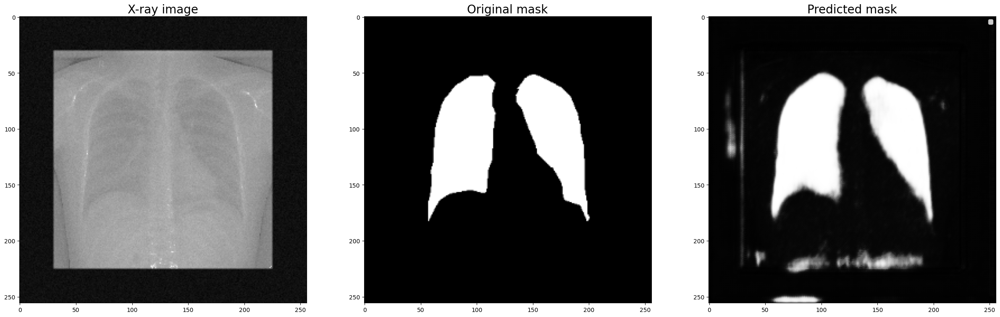

In [32]:
from utils import get_largest_segments_bounding_box, check_metrics
from copy import copy
test_image, test_mask = next(iter(test_loader))
x = test_image.to(DEVICE)
y = test_mask.to(DEVICE)
preds = Own_unet(x)
preds = torch.sigmoid(preds)
#preds = (preds > 0.5).float()
boxes_mask = get_largest_segments_bounding_box(test_mask)[0]
boxes_pred = get_largest_segments_bounding_box(preds.cpu().detach().numpy())[0]

fig, axs = plt.subplots(1, 3, figsize=(30, 10))
rect_pred = patches.Rectangle((boxes_pred[0], boxes_pred[1]), boxes_pred[2] - boxes_pred[0],
                                boxes_pred[3] - boxes_pred[1], linewidth=4, edgecolor='orange', facecolor='none', label='predicted crop')
rect_mask = patches.Rectangle((boxes_mask[0], boxes_mask[1]), boxes_mask[2] - boxes_mask[0],
                                boxes_mask[3] - boxes_mask[1], linewidth=4, edgecolor='green', facecolor='none', label='original crop')

axs[0].imshow(test_image[0, 0], cmap='gray')
axs[0].set_title('X-ray image', fontsize=20)

axs[1].imshow(test_mask[0, 0], cmap='gray')
axs[1].set_title('Original mask', fontsize=20)

axs[2].imshow(preds[0, 0].cpu().detach().numpy(), cmap='gray')
axs[2].set_title('Predicted mask', fontsize=20)

try:
    fig.suptitle(check_metrics(y[0].unsqueeze(0), preds[0].unsqueeze(0)), fontsize=30)
except:
    pass
plt.legend()
plt.show()

In [ ]:
i = 0
test_loader_iter = iter(test_loader)
for i in range(5):
    image, mask = next(test_loader_iter)
    plot_image_mask_box_pred_box_tolerance(Own_unet, image, mask,tolerance=0, device="cuda") 
    plot_image_mask_box_pred_box_tolerance(Monai_UNet, image, mask, tolerance=0, device="cuda")

    

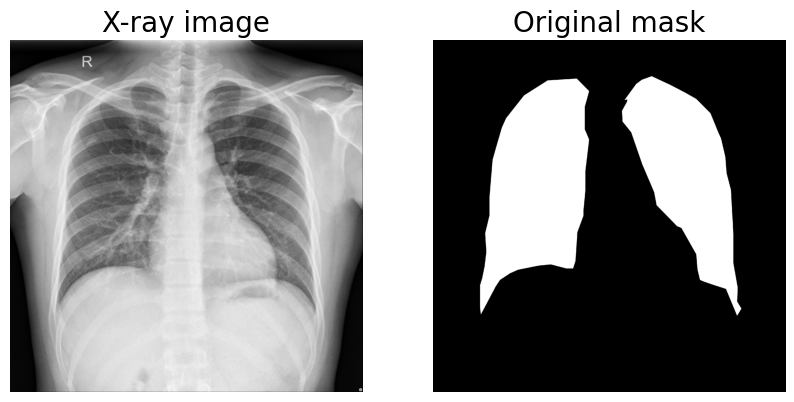

In [23]:
from utils import get_loaders
train_loader, test_loader, validation_loader = get_loaders()


for image, mask in test_loader:
    fig, axs = plt.subplots(1, 2, figsize=(10, 8))
    axs[0].imshow(image[0, 0], cmap='gray')
    axs[0].set_title('X-ray image', fontsize=20)
    axs[0].axis('off')
    axs[1].imshow(mask[0, 0], cmap='gray')
    axs[1].set_title('Original mask', fontsize=20)
    axs[1].axis('off')
    plt.savefig(r'/home/alex/Documents/Images_thesis/segmentation_data_example.png', bbox_inches="tight")
    plt.show()
    break